## Download Dataset

In [1]:
!wget "https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip"

--2023-08-30 12:55:06--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 104.97.45.22, 2600:1409:9800:98c::317f, 2600:1409:9800:984::317f
Connecting to download.microsoft.com (download.microsoft.com)|104.97.45.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip’

kagglecatsanddogs_5 100%[===================>] 786.67M   148MB/s    in 5.2s    

2023-08-30 12:55:12 (151 MB/s) - ‘kagglecatsanddogs_5340.zip’ saved [824887076/824887076]



## Unzip The Dataset

In [2]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

## Import Basic Module

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import warnings
import os
import random
import tqdm
from keras.preprocessing.image import linalg
# from keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')
#import

## Create DataFrame for Input and Output

In [4]:
input_path = []
label = []

for class_name in os.listdir("PetImages"):
  for path in os.listdir("PetImages/"+class_name):
    if class_name == 'Cat':
      label.append(0)
    else:
      label.append(1)
    input_path.append(os.path.join("PetImages",class_name,path))
print(input_path[0],label[0])

PetImages/Dog/233.jpg 1


To Find Total Length

In [5]:
df = pd.DataFrame()
df['images'] = input_path
df['label'] = label
df = df.sample(frac=1).reset_index(drop = True)
df.head()

,images,label
0,PetImages/Dog/3694.jpg,1
1,PetImages/Dog/6539.jpg,1
2,PetImages/Cat/1340.jpg,0
3,PetImages/Dog/8011.jpg,1
4,PetImages/Dog/5494.jpg,1


In [6]:
for i in df['images']:
    if '.jpg' not in i:
        print(i)


PetImages/Cat/Thumbs.db
PetImages/Dog/Thumbs.db


In [7]:
import PIL
l = []
for image in df['images']:
    try:
        img = PIL.Image.open(image)
    except:
        l.append(image)
l

['PetImages/Cat/Thumbs.db',
 'PetImages/Dog/11702.jpg',
 'PetImages/Dog/Thumbs.db',
 'PetImages/Cat/666.jpg']

In [8]:
# delete db files
df = df[df['images']!='PetImages/Dog/Thumbs.db']
df = df[df['images']!='PetImages/Cat/Thumbs.db']
df = df[df['images']!='PetImages/Cat/666.jpg']
df = df[df['images']!='PetImages/Dog/11702.jpg']
len(df)

24998

## Exploratory Data Analysis

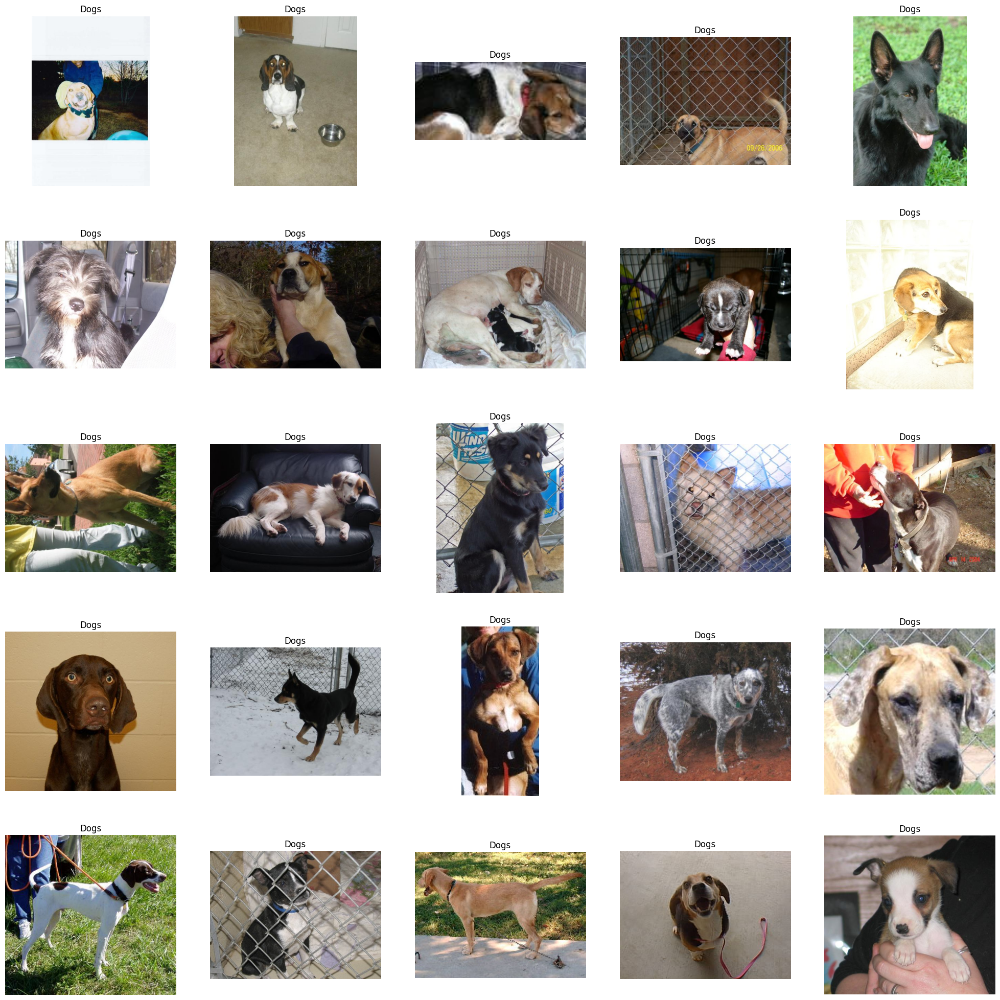

In [9]:
from keras.utils.image_utils import load_img
plt.figure(figsize = (25,25))
temp = df[df['label'] == 1]['images'] # 'temp' is a dataframe
start = random.randint(0,len(temp))
files = temp[start:start+25]  #'files' is a list

for index,file in enumerate(files):
  plt.subplot(5,5,index+1)
  img = load_img(file)  # (load_img)??
  img = np.array(img)
  plt.imshow(img)
  plt.title('Dogs')
  plt.axis('off')

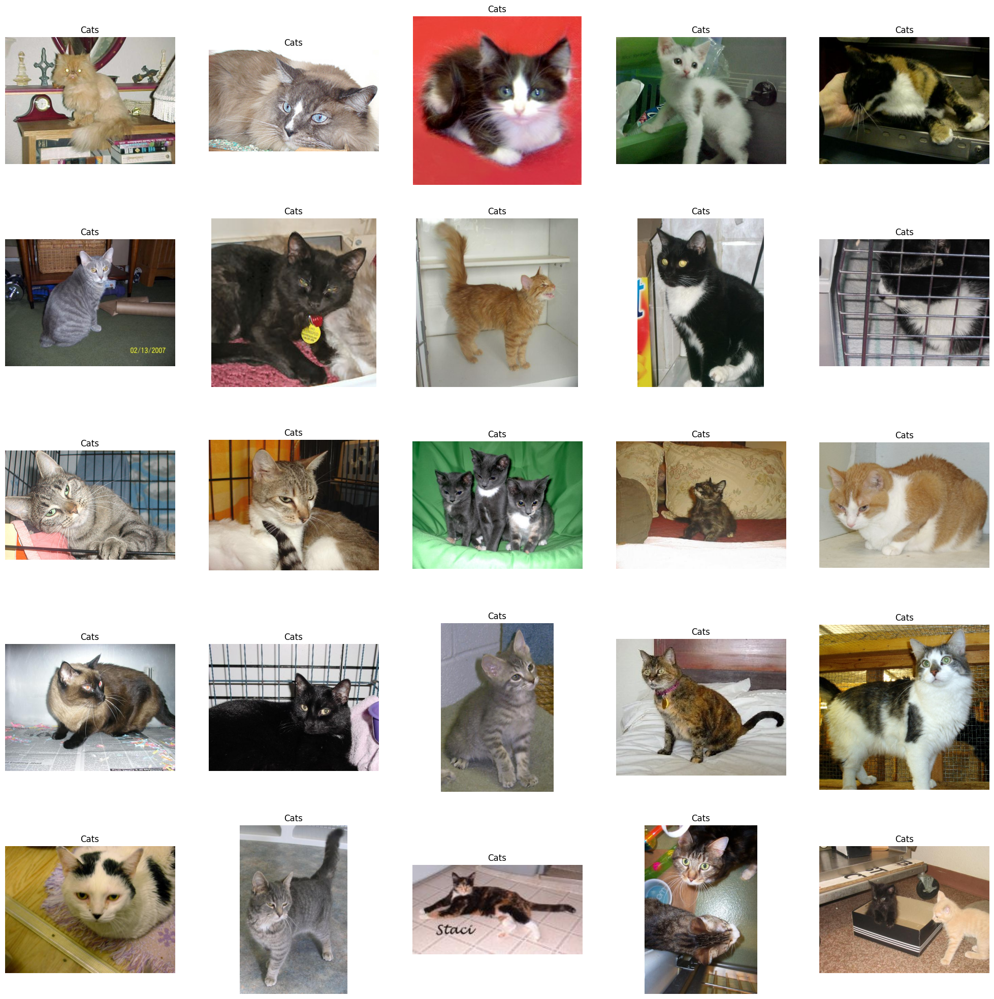

In [10]:
# from keras.utils.image_utils import load_img
plt.figure(figsize = (25,25))
temp = df[df['label'] == 0]['images']
start = random.randint(0,len(temp))
files = temp[start:start+25]

for index,file in enumerate(files):
  plt.subplot(5,5,index+1)
  img = load_img(file)  # (load_img)??
  img = np.array(img)
  plt.imshow(img)
  plt.title('Cats')
  plt.axis('off')

<Axes: ylabel='count'>

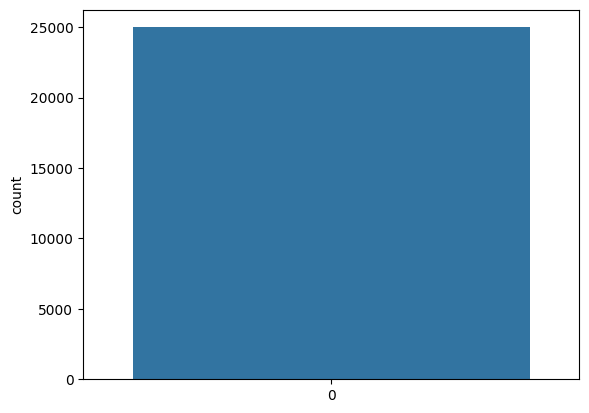

In [11]:
import seaborn as sns
sns.countplot(df['label'])

## Create Data Generator for The Images

In [12]:
df['label'] = df['label'].astype('str')
df.head()

,images,label
0,PetImages/Dog/3694.jpg,1
1,PetImages/Dog/6539.jpg,1
2,PetImages/Cat/1340.jpg,0
3,PetImages/Dog/8011.jpg,1
4,PetImages/Dog/5494.jpg,1


In [13]:
# input split
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=42)

In [14]:
train.head()

,images,label
23290,PetImages/Dog/3838.jpg,1
17785,PetImages/Cat/7427.jpg,0
1021,PetImages/Dog/8692.jpg,1
12645,PetImages/Dog/10095.jpg,1
1534,PetImages/Dog/5724.jpg,1


In [15]:
from keras.preprocessing.image import ImageDataGenerator
train_generator = ImageDataGenerator(
    rescale = 1./255,  # normalization of images
    rotation_range = 40, # augmention of images to avoid overfitting
    shear_range = 0.2,
    zoom_range = 0.2,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

val_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test,x_col='images',
    y_col='label',
    target_size=(128,128),
    batch_size=512,
    class_mode='binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


## Model Creation

In [16]:
from keras import Sequential
from keras.layers import Conv2D,MaxPool2D,Flatten,Dense

model = Sequential([
    Conv2D(16,(3,3) , activation='relu',input_shape=(128,128,3)), # create layer
    MaxPool2D((2,2)),
    Conv2D(32,(3,3) , activation='relu'),
    MaxPool2D((2,2)),
    Conv2D(64,(3,3), activation='relu'),
    MaxPool2D((2,2)),
    Flatten(),
    Dense(512, activation='relu'),
    Dense(1, activation='sigmoid') #may be different
])

In [17]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy']) # it improves the model
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 16)      448       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 16)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        4640      
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 30, 30, 32)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 28, 28, 64)        18496     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 14, 14, 64)       0

In [18]:
history = model.fit(train_iterator, epochs=10, validation_data=val_iterator)

Epoch 1/10
40/40 [==============================] - 124s 3s/step - loss: 0.7784 - accuracy: 0.5268 - val_loss: 0.6778 - val_accuracy: 0.5798
Epoch 2/10
40/40 [==============================] - 108s 3s/step - loss: 0.6577 - accuracy: 0.6033 - val_loss: 0.6241 - val_accuracy: 0.6460
Epoch 3/10
40/40 [==============================] - 110s 3s/step - loss: 0.6147 - accuracy: 0.6620 - val_loss: 0.6111 - val_accuracy: 0.6642
Epoch 4/10
40/40 [==============================] - 109s 3s/step - loss: 0.5748 - accuracy: 0.6985 - val_loss: 0.5531 - val_accuracy: 0.7190
Epoch 5/10
40/40 [==============================] - 109s 3s/step - loss: 0.5425 - accuracy: 0.7230 - val_loss: 0.5274 - val_accuracy: 0.7312
Epoch 6/10
40/40 [==============================] - 110s 3s/step - loss: 0.5296 - accuracy: 0.7304 - val_loss: 0.4949 - val_accuracy: 0.7588
Epoch 7/10
40/40 [==============================] - 108s 3s/step - loss: 0.5054 - accuracy: 0.7524 - val_loss: 0.5086 - val_accuracy: 0.7578
Epoch 8/10
40

## Visualisations of Results

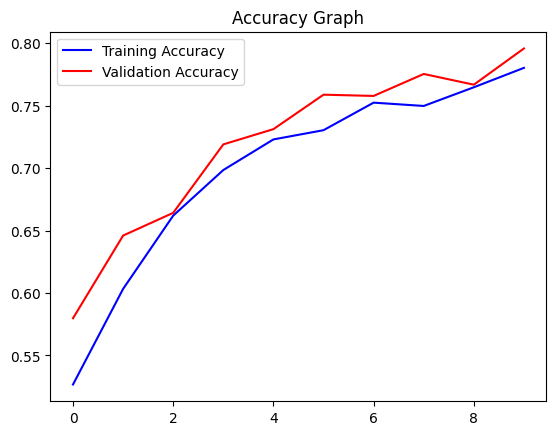

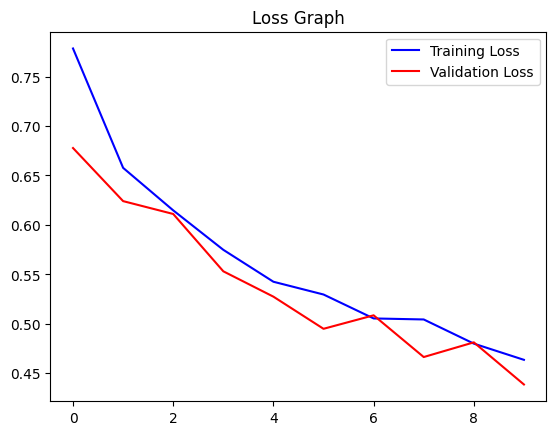

In [19]:
acc = history.history['accuracy']
val_acc = history.history['val_accuracy']
epochs = range(len(acc))

plt.plot(epochs, acc, 'b', label='Training Accuracy')
plt.plot(epochs, val_acc, 'r', label='Validation Accuracy')
plt.title('Accuracy Graph')
plt.legend()
plt.figure()

loss = history.history['loss']
val_loss = history.history['val_loss']
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Loss Graph')
plt.legend()
plt.show()

## Test With Real Image

In [20]:
image_path = "animal_3.jpg"
img = load_img(image_path, target_size=(128, 128))
img = np.array(img)
img = img / 255.0 # normalize the image
img = img.reshape(1, 128, 128, 3) # reshape for prediction
pred = model.predict(img)
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'
print(label)

1/1 [==============================] - 0s 282ms/step
Dog


In [22]:
image_paths = ["animal_c1.jpeg", "animal_2.jpg", "animal_3.jpg"]

for image_path in image_paths:
    img = load_img(image_path, target_size=(128, 128))
    img = np.array(img)
    img = img / 255.0
    img = img.reshape(1, 128, 128, 3)

    pred = model.predict(img)
    if pred[0] > 0.5:
        label = 'Dog'
    else:
        label = 'Cat'

    print(f"Image: {image_path}, Predicted: {label}")


1/1 [==============================] - 0s 20ms/step
Image: animal_c1.jpeg, Predicted: Dog
1/1 [==============================] - 0s 20ms/step
Image: animal_2.jpg, Predicted: Dog
1/1 [==============================] - 0s 19ms/step
Image: animal_3.jpg, Predicted: Dog
